# G3Py: Generalized Graphical Gaussian Processes in Python

## Imports and Sunspots Dataset

/home/grios/anaconda3/lib/python3.6/site-packages/statsmodels/compat/pandas.py:56: FutureWarning: The pandas.core.datetools module is deprecated and will be removed in a future version. Please use the pandas.tseries module instead.
  from pandas.core import datetools


::

    Number of Observations - 309 (Annual 1700 - 2008)
    Number of Variables - 1
    Variable name definitions::

        SUNACTIVITY - Number of sunspots for each year

    The data file contains a 'YEAR' variable that is not returned by load.

Total: 309 | Obs: 30 (9.70873786407767%)


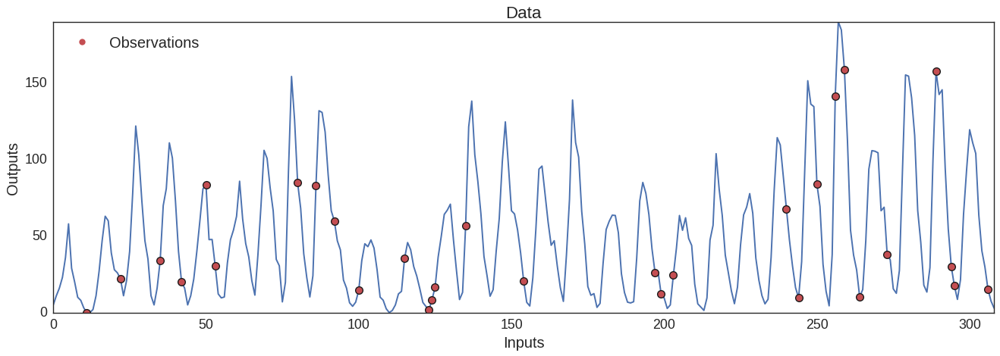

In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

import numpy as np
import pandas as pd
import g3py as g3
import pymc3 as pm
import theano as th
import theano.tensor as tt

g3.style_normal()
g3.style_widget()

psamples = 0.1
data = 'subspots'


if data == 'subspots':
    x, y = g3.data_sunspots()
else:
    x, y = g3.data_heart()


obs_j, x_obs, y_obs, test_j, x_test, y_test = g3.random_obs(x, y, psamples, plot=True)

## Define Prior Distribution

{'GP_Bias_Bias': 0.5,
 'GP_Noise_var_log__': array(-1.3862943649291992, dtype=float32),
 'GP_SE_rate_log__': array([-0.69314718], dtype=float32),
 'GP_SE_var_log__': array(-1.3862943649291992, dtype=float32)}
array(0.0, dtype=float32)


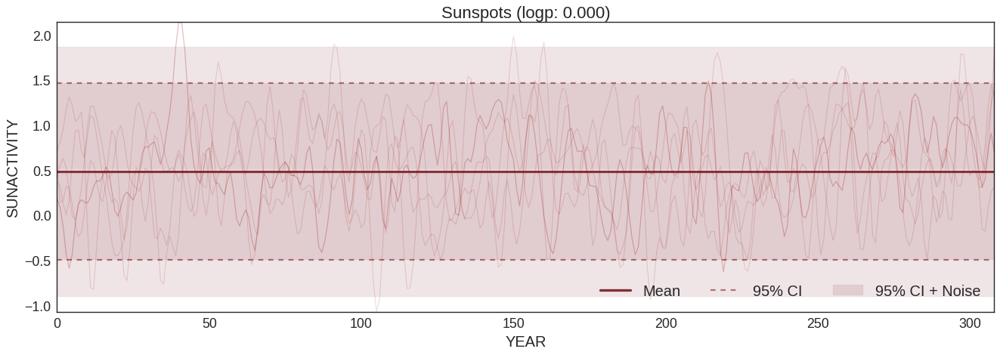

In [2]:
gp = g3.GaussianProcess(space=x, location=g3.Bias(), kernel=g3.SE(), noisy=True)
gp.describe('Sunspots', 'YEAR', 'SUNACTIVITY')
gp.plot(samples=5)
g3.print(gp.params, gp.logp(gp.params))

## Default Posterior Distribution, given observations (automatic parameters)

{'GP_Bias_Bias': 45.506664,
 'GP_Noise_var_log__': array(7.55460786819458, dtype=float32),
 'GP_SE_rate_log__': array([-3.01282668], dtype=float32),
 'GP_SE_var_log__': array(7.55460786819458, dtype=float32)}
array(-158.28897094726562, dtype=float32)
{'_l1': 30.565249318983952, '_l2': 1482.5460432915916}


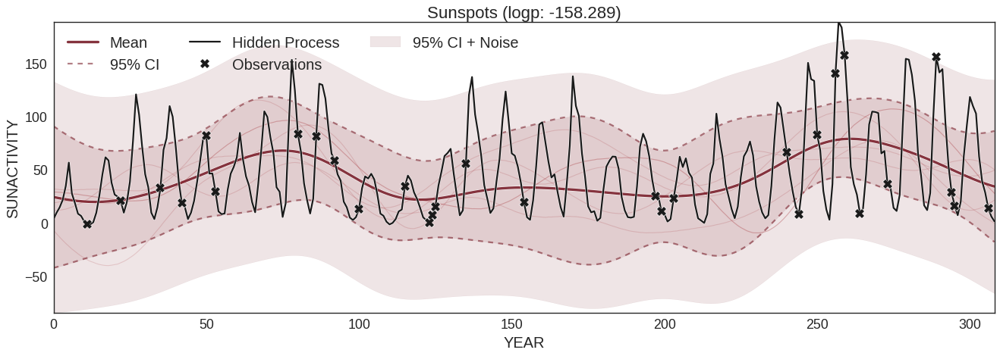

In [3]:
gp.observed(inputs=x_obs, outputs=y_obs, hidden=y)
gp.plot(samples=5)
g3.print(gp.params, gp.logp(gp.params), gp.scores(gp.params))

## Manual Search of parameters

In [4]:
gp.widget(samples=5)

A Jupyter Widget

## Change style and get widget params

{'GP_Bias_Bias': array(45.50666427612305, dtype=float32),
 'GP_Noise_var': array([ 200.33685303], dtype=float32),
 'GP_Noise_var_log__': array(5.300000190734863, dtype=float32),
 'GP_SE_rate': array([ 0.18718646], dtype=float32),
 'GP_SE_rate_log__': array([-1.67565], dtype=float32),
 'GP_SE_var': array([ 4023.87304688], dtype=float32),
 'GP_SE_var_log__': array(8.300000190734863, dtype=float32),
 '_l1': 32.101827591831253,
 '_l2': 1921.446316073547,
 '_ll': array(-156.30870056152344, dtype=float32)}

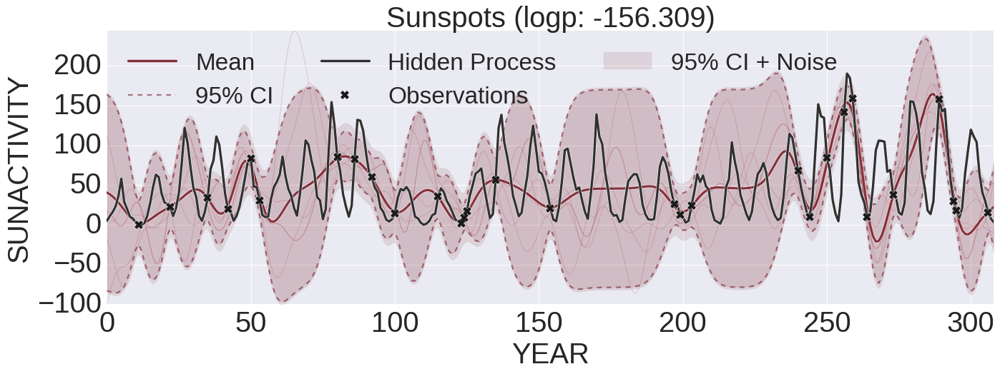

In [6]:
g3.style_big_seaborn()
gp.plot(gp.params_widget, samples=5)
gp.eval_params(gp.params_widget)

## Default find_MAP with derivative methods and free-derivative methods

In [17]:
params_map = gp.find_MAP(points=2)

'Starting function value (-logp): 158.289'
'start_bfgs'
         Current function value: 155.650238
         Iterations: 15
         Function evaluations: 140
         Gradient evaluations: 127
'start_powell'
Optimization terminated successfully.
         Current function value: 149.174805
         Iterations: 8
         Function evaluations: 442
'find_MAP'
{'GP_Bias_Bias': array(44.940589904785156, dtype=float32),
 'GP_Noise_var_log__': array(-1.612653374671936, dtype=float32),
 'GP_SE_rate_log__': array([-1.12080371], dtype=float32),
 'GP_SE_var_log__': array(7.480929851531982, dtype=float32)}


{'GP_Bias_Bias': array(44.940589904785156, dtype=float32),
 'GP_Noise_var': array([ 0.19935794], dtype=float32),
 'GP_Noise_var_log__': array(-1.612653374671936, dtype=float32),
 'GP_SE_rate': array([ 0.32601768], dtype=float32),
 'GP_SE_rate_log__': array([-1.12080371], dtype=float32),
 'GP_SE_var': array([ 1773.8894043], dtype=float32),
 'GP_SE_var_log__': array(7.480929851531982, dtype=float32),
 '_l1': 27.583199623873323,
 '_l2': 1405.7393970032117,
 '_ll': array(-149.1748046875, dtype=float32)}


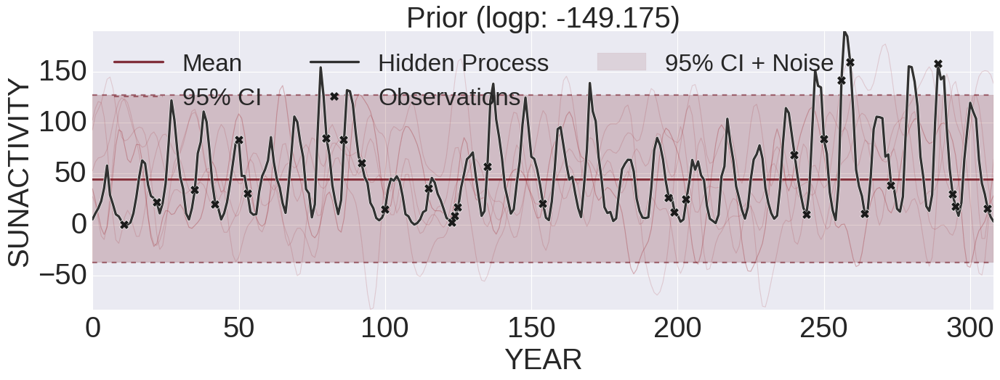

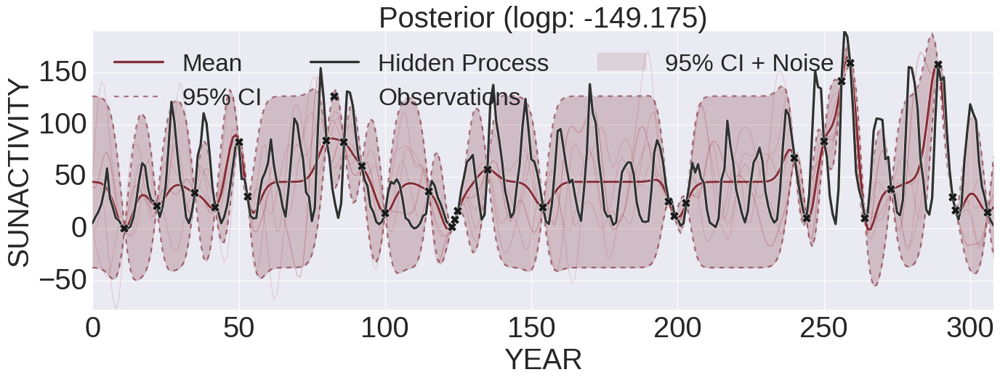

In [18]:
g3.print(gp.eval_params(params_map))
gp.plot(params_map, samples=5, prior=True, title='Prior')
g3.show()
gp.plot(params_map, samples=5, title='Posterior')
g3.show()

## Find MAP from random points

{'GP_Bias_Bias': array(45.10273742675781, dtype=float32),
 'GP_Noise_var': array([  2.47591106e-06], dtype=float32),
 'GP_Noise_var_log__': array(-12.908902168273926, dtype=float32),
 'GP_SE_rate': array([ 0.32362166], dtype=float32),
 'GP_SE_rate_log__': array([-1.12818015], dtype=float32),
 'GP_SE_var': array([ 1798.31005859], dtype=float32),
 'GP_SE_var_log__': array(7.494602680206299, dtype=float32),
 '_l1': 27.635520989377916,
 '_l2': 1410.8725456717752,
 '_ll': array(-149.15817260742188, dtype=float32)}


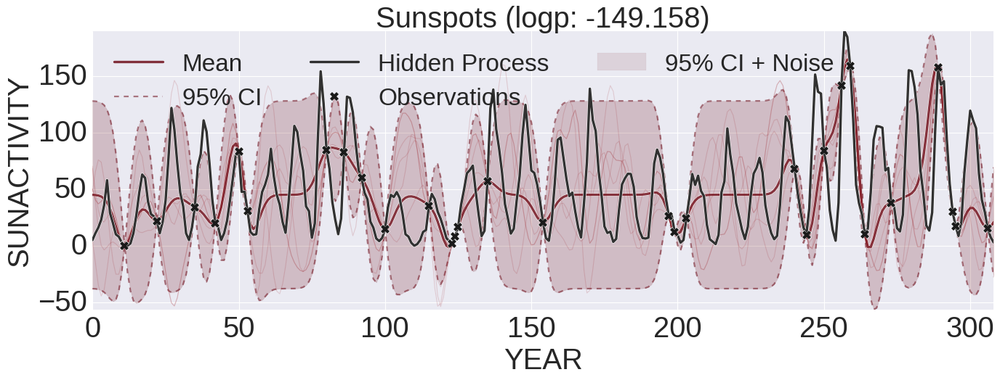

{'GP_Bias_Bias': array(44.86204147338867, dtype=float32),
 'GP_Noise_var': array([ 0.22768281], dtype=float32),
 'GP_Noise_var_log__': array(-1.4798017740249634, dtype=float32),
 'GP_SE_rate': array([ 0.32135072], dtype=float32),
 'GP_SE_rate_log__': array([-1.1352222], dtype=float32),
 'GP_SE_var': array([ 1800.70324707], dtype=float32),
 'GP_SE_var_log__': array(7.495932579040527, dtype=float32),
 '_l1': 27.673752679176705,
 '_l2': 1417.0248716905787,
 '_ll': array(-149.17709350585938, dtype=float32)}


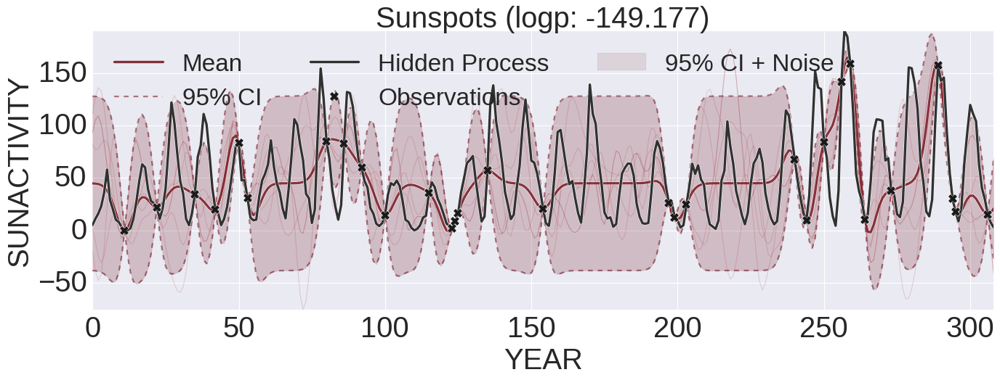

{'GP_Bias_Bias': array(45.110355377197266, dtype=float32),
 'GP_Noise_var': array([  3.88169938e-05], dtype=float32),
 'GP_Noise_var_log__': array(-10.156652450561523, dtype=float32),
 'GP_SE_rate': array([ 0.32434958], dtype=float32),
 'GP_SE_rate_log__': array([-1.12593341], dtype=float32),
 'GP_SE_var': array([ 1795.85510254], dtype=float32),
 'GP_SE_var_log__': array(7.493236541748047, dtype=float32),
 '_l1': 27.621242334310288,
 '_l2': 1409.128197736635,
 '_ll': array(-149.15823364257812, dtype=float32)}


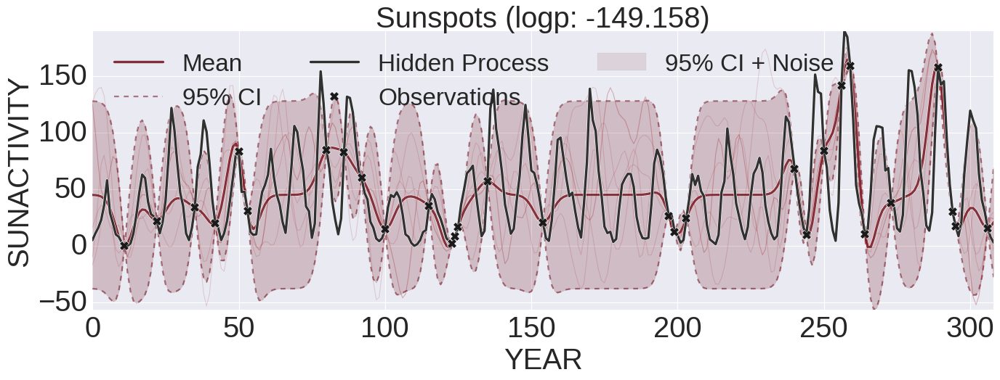

{'GP_Bias_Bias': array(45.03813934326172, dtype=float32),
 'GP_Noise_var': array([  4.53750399e-05], dtype=float32),
 'GP_Noise_var_log__': array(-10.000548362731934, dtype=float32),
 'GP_SE_rate': array([ 0.32328293], dtype=float32),
 'GP_SE_rate_log__': array([-1.1292274], dtype=float32),
 'GP_SE_var': array([ 1799.56164551], dtype=float32),
 'GP_SE_var_log__': array(7.495298385620117, dtype=float32),
 '_l1': 27.642271436919671,
 '_l2': 1411.9428132667501,
 '_ll': array(-149.158203125, dtype=float32)}


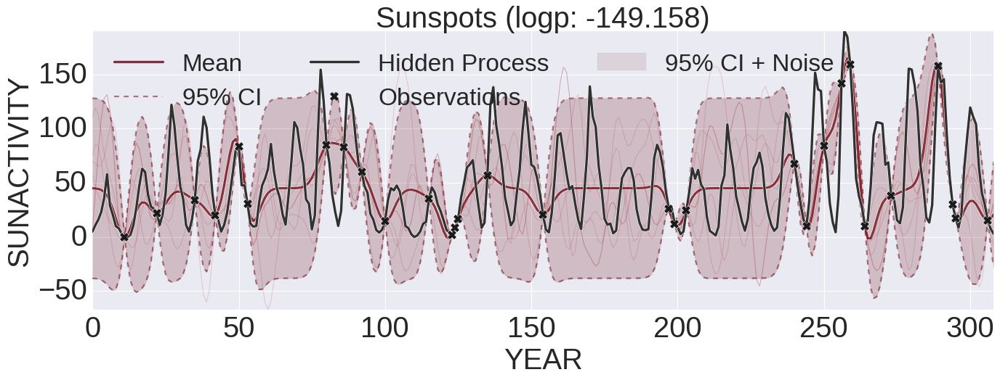

{'GP_Bias_Bias': array(45.08441925048828, dtype=float32),
 'GP_Noise_var': array([  7.11964967e-05], dtype=float32),
 'GP_Noise_var_log__': array(-9.550066947937012, dtype=float32),
 'GP_SE_rate': array([ 0.32358027], dtype=float32),
 'GP_SE_rate_log__': array([-1.12830806], dtype=float32),
 'GP_SE_var': array([ 1798.11291504], dtype=float32),
 'GP_SE_var_log__': array(7.494493007659912, dtype=float32),
 '_l1': 27.636361781987556,
 '_l2': 1411.0464832420703,
 '_ll': array(-149.15817260742188, dtype=float32)}


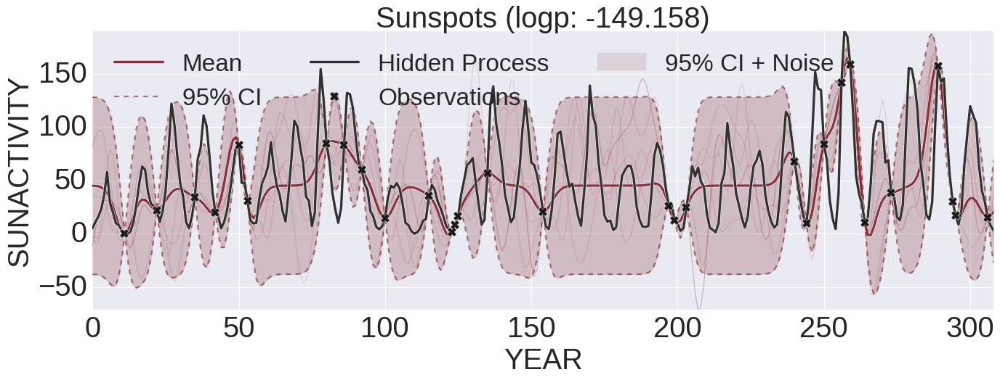

In [19]:
for k in range(5):
    init_params = gp.params_random(gp.params_widget, sigma=0.2)
    params = gp.find_MAP(init_params, points=2, display=False)
    g3.print(gp.eval_params(params))
    gp.plot(params, samples=5)
    g3.show()

## Get prediction and custom plot

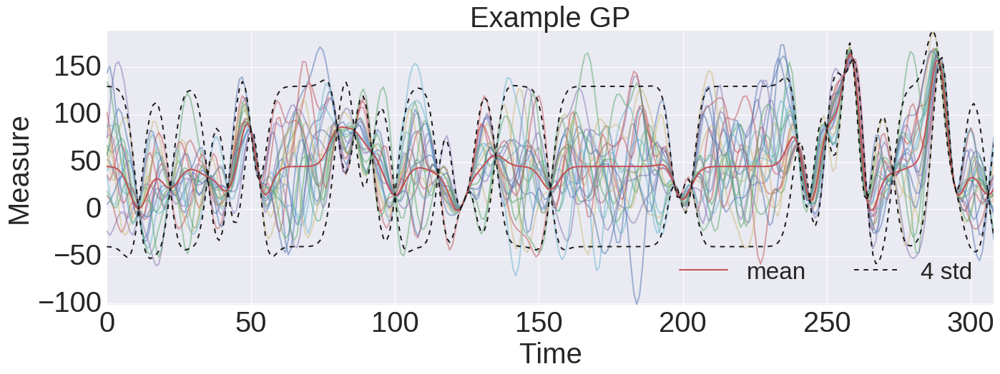

In [20]:
prediction = gp.predict(params, samples=20)
mu, std, samples = prediction.mean, prediction.std, prediction.samples
g3.plot(samples, alpha=0.5)
g3.plot(mu, 'r', label='mean')
g3.plot(mu + 2*std, '--k', label='4 std')
g3.plot(mu - 2*std, '--k')
g3.plot_text('Example GP', 'Time', 'Measure')
g3.plot_save('images/gp_sunspots3.pdf')

# Sampling Hyperparameters with Ensemble MCMC

In [21]:
datatrace = gp.sample_hypers(start=params, samples=10000, chains=10)
datatrace

Sampling 4 variables, 10 chains, 10000 times (None temps)


100%|██████████| 10000/10000 [02:12<00:00, 75.69it/s]


,GP_Noise_var_log__,GP_SE_rate_log____0,GP_SE_var_log__,GP_Bias_Bias,GP_Noise_var_,GP_SE_var_,_nchain,_niter,_burnin,_outlayer,_ll,_cluster
0,-9.286202,-0.991204,7.484601,34.182399,0.000093,1780.413696,0,0,False,True,-150.276321,1
1,-9.286202,-0.991204,7.484601,34.182399,0.000093,1780.413696,0,1,False,True,-150.276321,1
2,-9.286202,-0.991204,7.484601,34.182399,0.000093,1780.413696,0,2,False,True,-150.276321,1
3,-9.369094,-0.905048,7.428005,31.230636,0.000085,1682.447266,0,3,False,True,-151.306671,1
4,-9.369094,-0.905048,7.428005,31.230636,0.000085,1682.447266,0,4,False,True,-151.306671,1
5,-9.369094,-0.905048,7.428005,31.230636,0.000085,1682.447266,0,5,False,True,-151.306671,1
6,-9.369094,-0.905048,7.428005,31.230636,0.000085,1682.447266,0,6,False,True,-151.306671,1
7,-9.517644,-0.933640,7.473416,32.139181,0.000074,1760.611206,0,7,False,True,-150.911026,1
8,-9.517644,-0.933640,7.473416,32.139181,0.000074,1760.611206,0,8,False,True,-150.911026,1
9,-8.918349,-1.001705,7.535303,38.494836,0.000134,1873.011108,0,9,False,True,-149.739182,1


## Convergence Diagnostics

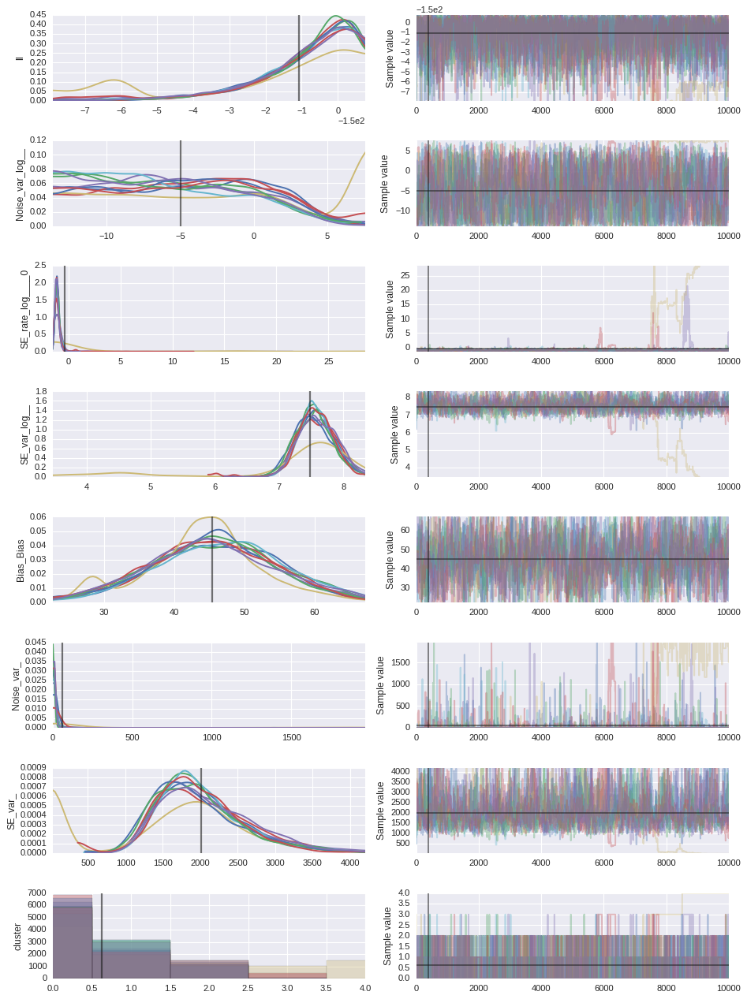

In [48]:
g3.style_seaborn()
g3.plot_datatrace(datatrace)

## Plot Marginals and reference parameters

/home/grios/anaconda3/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:106: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)


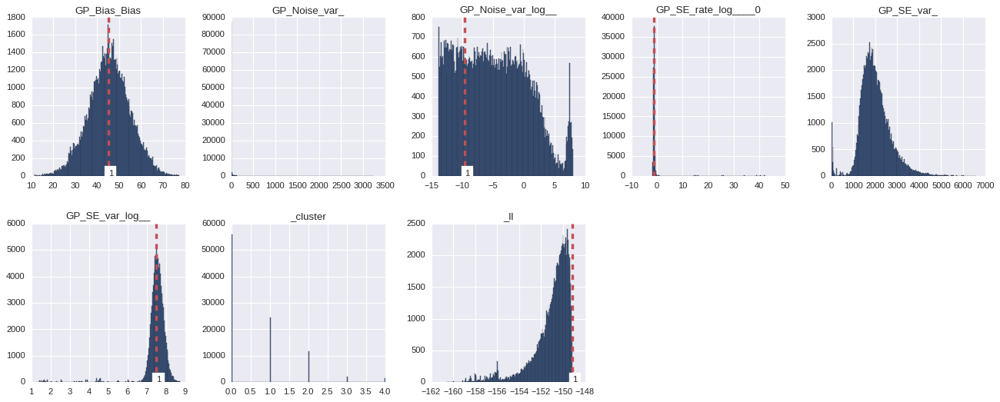

In [52]:
g3.hist_datatrace(datatrace, reference=gp.eval_params(params))

## Clustering of parameters and plot Bivariate distributions

In [13]:
g3.cluster_datatrace(gp, datatrace)

<function g3py.bayesian.average.cluster_datatrace.<locals>._cluster>

[autoreload of seaborn.external.six failed: Traceback (most recent call last):
  File "/home/grios/anaconda3/lib/python3.6/site-packages/IPython/extensions/autoreload.py", line 246, in check
    superreload(m, reload, self.old_objects)
  File "/home/grios/anaconda3/lib/python3.6/site-packages/IPython/extensions/autoreload.py", line 385, in superreload
    update_generic(old_obj, new_obj)
  File "/home/grios/anaconda3/lib/python3.6/site-packages/IPython/extensions/autoreload.py", line 324, in update_generic
    update(a, b)
  File "/home/grios/anaconda3/lib/python3.6/site-packages/IPython/extensions/autoreload.py", line 276, in update_class
    old_obj = getattr(old, key)
  File "/home/grios/anaconda3/lib/python3.6/site-packages/seaborn/external/six.py", line 93, in __get__
    setattr(obj, self.name, result)  # Invokes __set__.
AttributeError: 'NoneType' object has no attribute 'cStringIO'
]


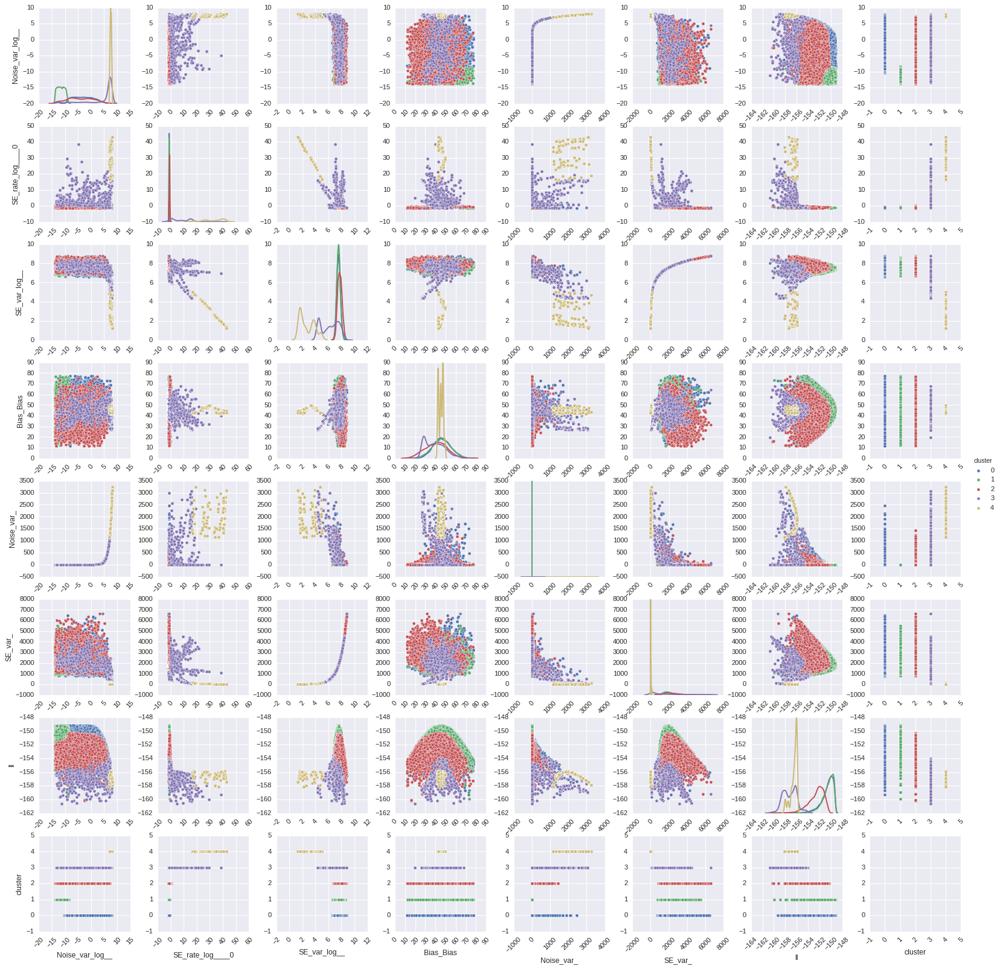

In [58]:
g3.scatter_datatrace(datatrace)

## Model Selection

In [59]:
candidates = g3.find_candidates(datatrace, ll=1, by_cluster=True)
candidates

,GP_Noise_var_log__,GP_SE_rate_log____0,GP_SE_var_log__,GP_Bias_Bias,GP_Noise_var_,GP_SE_var_,_nchain,_niter,_burnin,_outlayer,_ll,_cluster
ll0,-7.934219,-1.137627,7.505926,45.174697,0.000358,1818.788086,5,2326,True,False,-149.159851,0
ll1,-10.404723,-1.113888,7.478167,44.692782,0.000030,1768.995361,3,3492,True,False,-149.163010,1
ll2,-8.328585,-0.827591,7.500161,42.778814,0.000242,1808.334717,9,66,False,True,-150.256744,2
ll3,6.294276,-1.519978,7.030455,43.162771,541.463562,1130.544434,1,1118,True,True,-154.031769,3
ll4,7.571921,41.415492,1.537436,44.619727,1942.869629,4.652648,4,9591,True,True,-155.896225,4


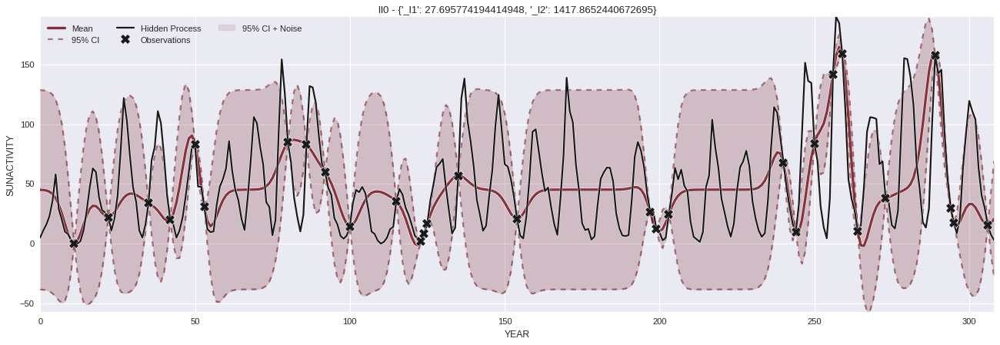

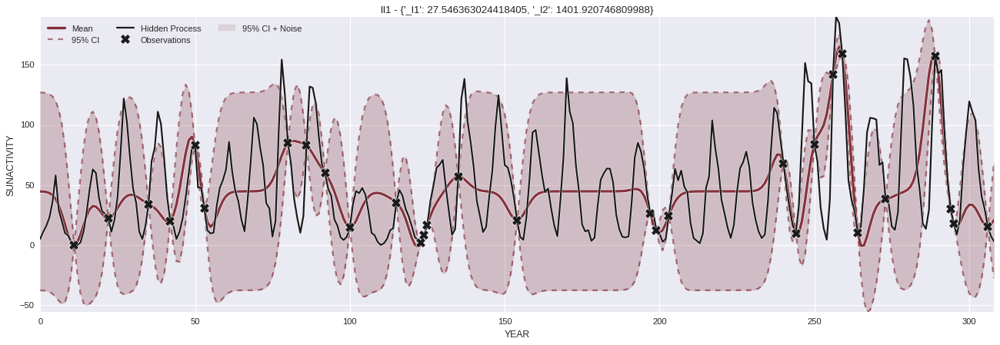

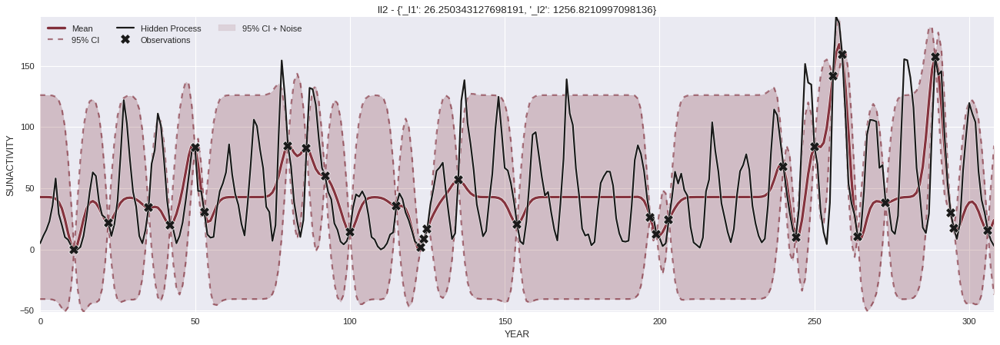

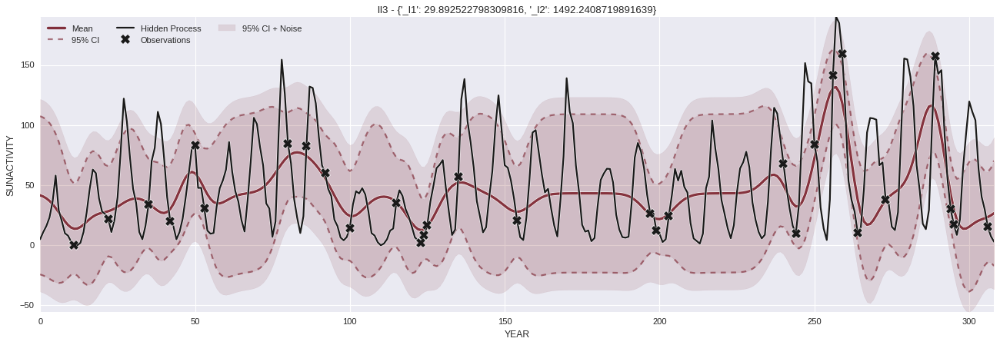

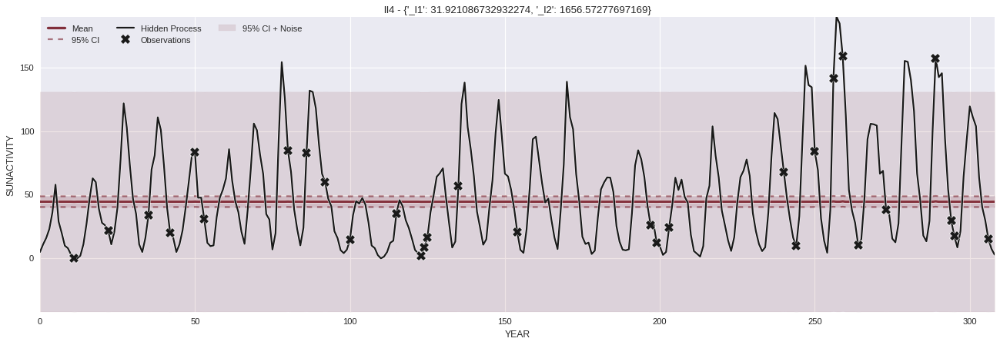

In [60]:
gp.plot_datatrace(candidates)

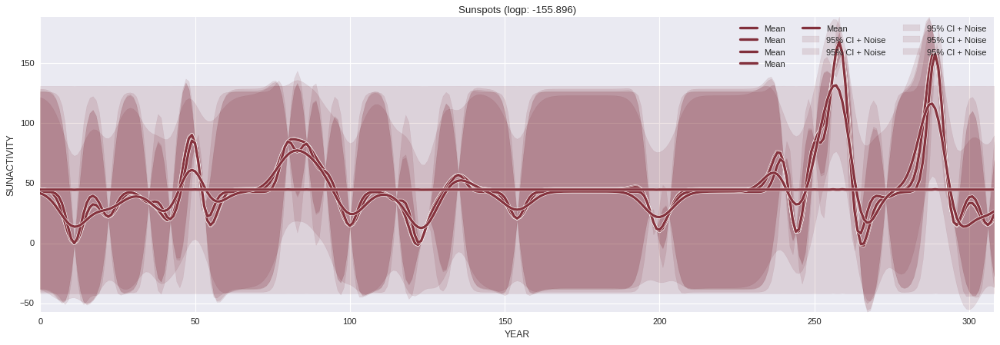

In [66]:
gp.plot_datatrace(candidates, overlap=True, limit=5, quantiles=False, noise=False, samples=0, data=False, loc=True)

## Model Average

In [67]:
average = gp.average(candidates, quantiles=True, quantiles_noise=True)
average

{'_l1': 28.661217968147547,
 '_l2': 1445.0841468116457,
 'mean': array([  43.73690796,   43.46651459,   43.00093842,   42.20419312,
          40.86302567,   38.67983246,   35.31892776,   30.56640244,
          24.62968254,   18.4360714 ,   13.58092976,   11.65083027,
          13.38030052,   17.97171974,   23.75722885,   29.0264225 ,
          32.69774246,   34.39331055,   34.22041702,   32.62046432,
          30.35517502,   28.43251419,   27.77888489,   28.84884644,
          31.31088829,   34.394104  ,   37.30519867,   39.56244659,
          41.01964188,   41.71780396,   41.74403   ,   41.18032074,
          40.13541794,   38.80164337,   37.44768524,   36.28593063,
          35.31861115,   34.23322678,   32.64448166,   30.43160057,
          28.04477882,   26.49565506,   26.94154739,   30.1773262 ,
          36.2093811 ,   44.49536896,   54.12272263,   63.75507355,
          71.358078  ,   74.38829041,   70.96357727,   61.32019806,
          48.49850464,   36.77035141,   29.4299736 ,

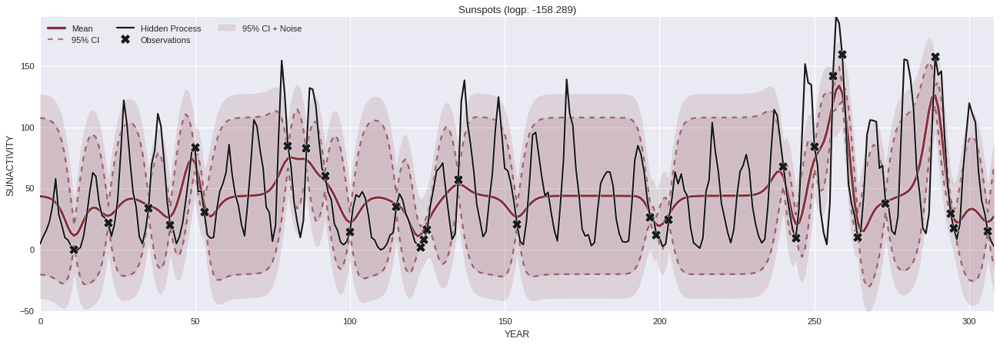

In [68]:
gp.plot(values=average)

## Sampling Particles

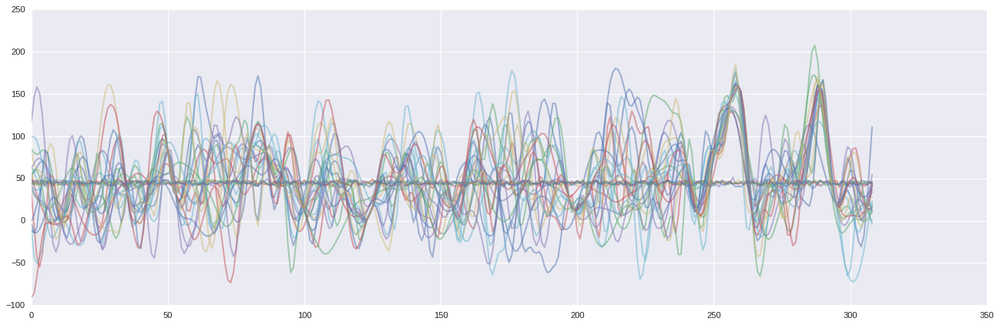

In [69]:
particles = gp.particles(candidates, nsamples=25)
g3.plot(particles, alpha=0.5)

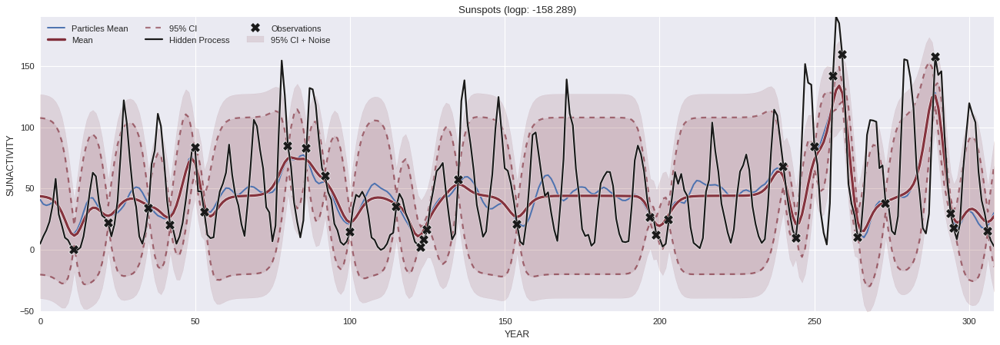

In [70]:
g3.plot(particles.mean(axis=1), label='Particles Mean')
gp.plot(values=average)

## Conditional and Marginal Datatrace as Empirical Distribution

#9997 (9.997 %)


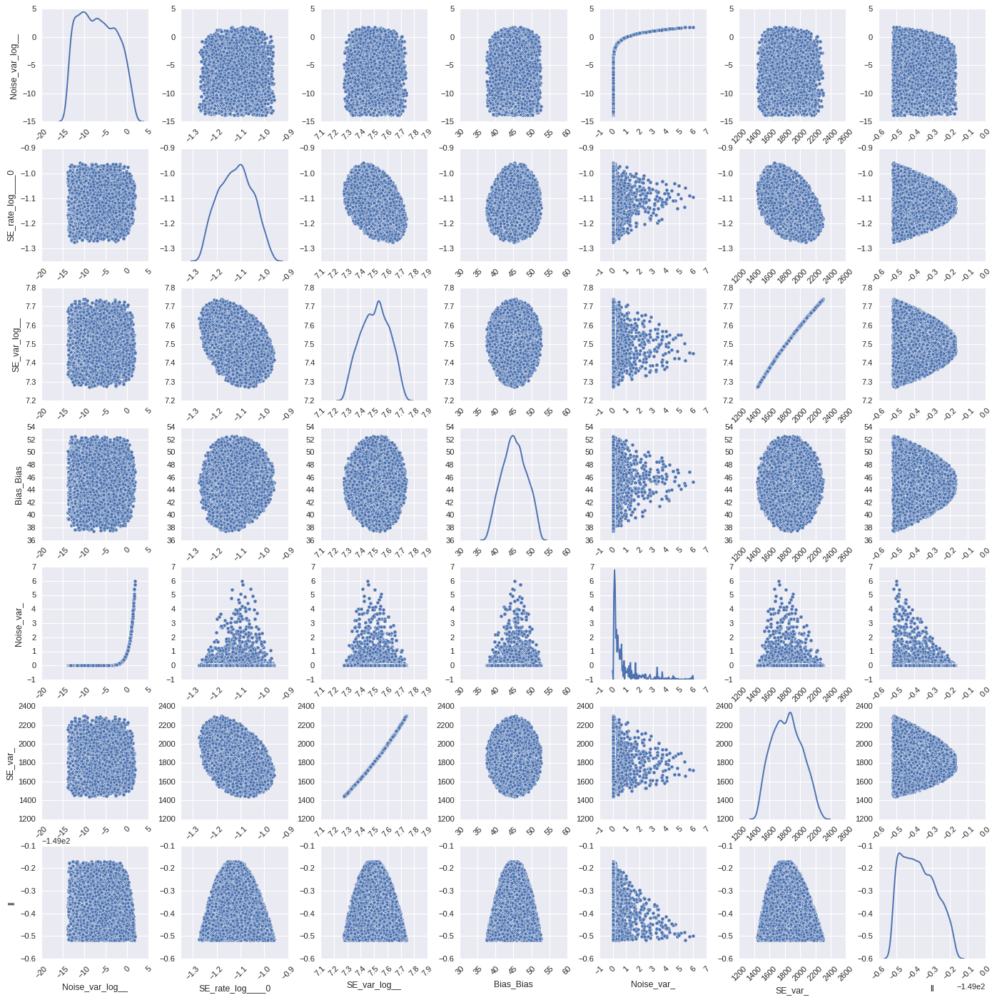

In [71]:
selected = g3.conditional_datatrace(datatrace, lambda df: df._ll > df._ll.quantile(0.9))
selected = g3.marginal_datatrace(selected, drop='_cluster')
g3.scatter_datatrace(selected)

## Kernel Density Estimation of Datatrace for sampling

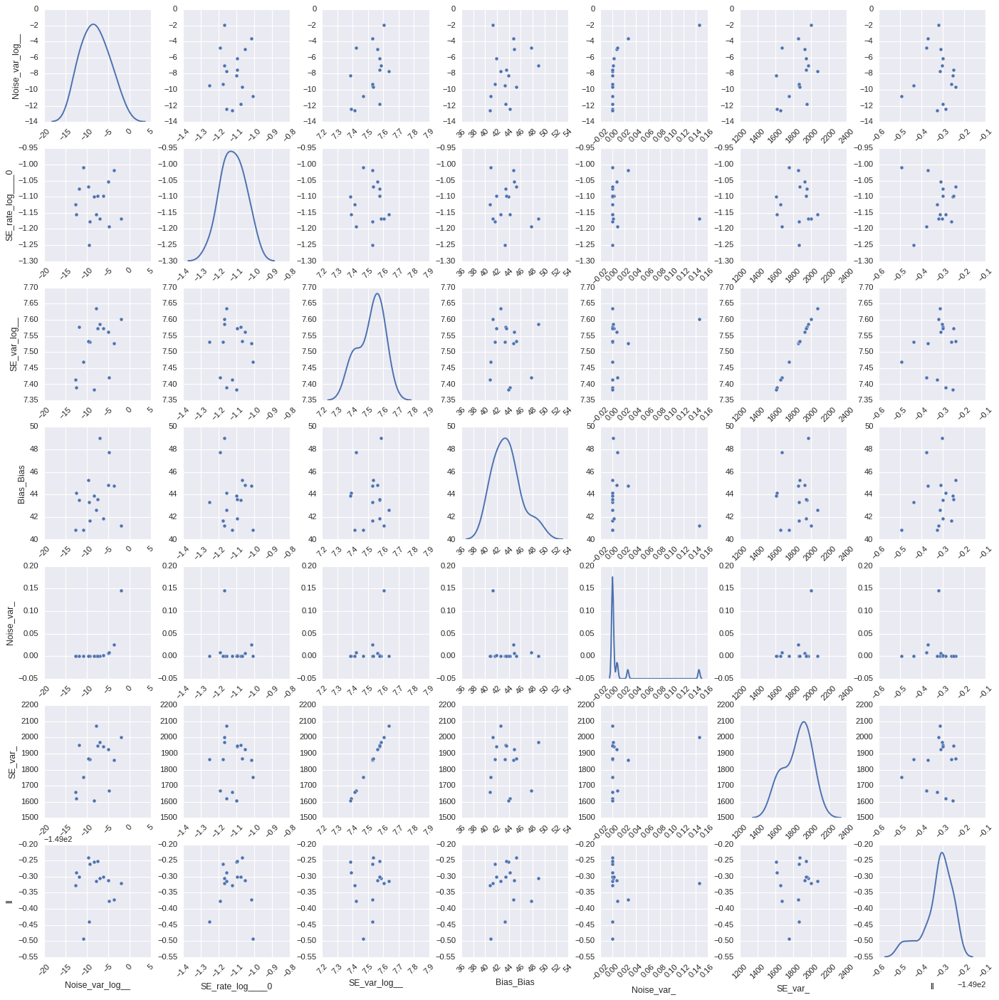

In [72]:
kde = g3.datatrace_to_kde(gp, selected)
models = g3.kde_to_datatrace(gp, kde, nsamples=25)
models = g3.marginal_datatrace(models, drop='_cluster')
g3.scatter_datatrace(models)

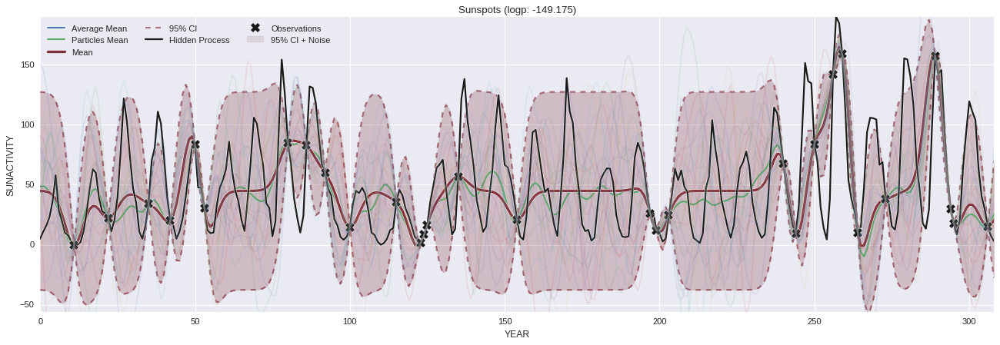

In [73]:
average = gp.average(models, quantiles=True, quantiles_noise=True)
particles = gp.particles(models)

g3.plot(average.mean, label='Average Mean')
g3.plot(particles.mean(axis=1), label='Particles Mean')
gp.plot(params_map)
g3.plot(particles, alpha=0.1)